<a href="https://colab.research.google.com/github/kanishk2412/CodSoft/blob/main/Upcrowd.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [9]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [10]:
import cv2
import os

# Define the paths
video_folder_path = '/content/drive/My Drive/CrowdCountingData'
output_frames_folder = '/content/drive/My Drive/CrowdCountingData/ExtractedFrames'

# Create the output folder if it does not exist
os.makedirs(output_frames_folder, exist_ok=True)

# Extract frames from videos
def extract_frames(video_path, output_folder, frame_interval=30):
    cap = cv2.VideoCapture(video_path)
    count = 0
    success = True

    video_name = os.path.basename(video_path).split('.')[0]
    video_frames_folder = os.path.join(output_folder, video_name)
    os.makedirs(video_frames_folder, exist_ok=True)

    while success:
        success, frame = cap.read()
        if success and count % frame_interval == 0:
            frame_filename = os.path.join(video_frames_folder, f'frame_{count}.jpg')
            cv2.imwrite(frame_filename, frame)
        count += 1
    cap.release()

# Process all videos in the folder
for video_filename in os.listdir(video_folder_path):
    video_path = os.path.join(video_folder_path, video_filename)
    if video_filename.endswith('.mp4'):
        extract_frames(video_path, output_frames_folder)


In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -r requirements.txt


In [12]:
import torch
import os
import cv2

# Load the pre-trained YOLOv5 model for object detection
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

# Paths to frames and annotation output directory
frames_folder = '/content/drive/My Drive/CrowdCountingData/ExtractedFrames'
labels_folder = '/content/drive/My Drive/CrowdCountingData/Labels'

# Create the labels folder if it doesn't exist
os.makedirs(labels_folder, exist_ok=True)

# Process each frame for labeling
def generate_labels_for_frames(frames_folder, labels_folder):
    for video_name in os.listdir(frames_folder):
        video_frames_path = os.path.join(frames_folder, video_name)
        video_labels_path = os.path.join(labels_folder, video_name)
        os.makedirs(video_labels_path, exist_ok=True)

        for frame_name in os.listdir(video_frames_path):
            if frame_name.endswith('.jpg'):
                frame_path = os.path.join(video_frames_path, frame_name)

                # Load the frame
                frame = cv2.imread(frame_path)

                # Run inference
                results = model(frame)

                # Extract detection results for 'person' class
                detections = results.xyxy[0]  # [x_min, y_min, x_max, y_max, confidence, class]

                label_file_path = os.path.join(video_labels_path, frame_name.replace('.jpg', '.txt'))

                with open(label_file_path, 'w') as f:
                    for *box, conf, cls in detections:
                        if int(cls) == 0:  # Class '0' corresponds to 'person' in COCO dataset
                            x_min, y_min, x_max, y_max = box

                            # Calculate normalized coordinates for YOLO format
                            img_height, img_width = frame.shape[:2]
                            x_center = (x_min + x_max) / 2 / img_width
                            y_center = (y_min + y_max) / 2 / img_height
                            width = (x_max - x_min) / img_width
                            height = (y_max - y_min) / img_height

                            # YOLOv5 format: <class> <x_center> <y_center> <width> <height>
                            f.write(f"0 {x_center} {y_center} {width} {height}\n")

# Generate labels for all frames
generate_labels_for_frames(frames_folder, labels_folder)


/usr/local/lib/python3.10/dist-packages/torch/hub.py:295: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2024-10-20 Python-3.10.12 torch-2.4.1+cu121 CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 123MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ul

In [15]:
import os
import shutil
import random

# Define paths to frames and labels folders
frames_folder = '/content/drive/My Drive/CrowdCountingData/ExtractedFrames'
labels_folder = '/content/drive/My Drive/CrowdCountingData/Labels'

# Define paths to YOLOv5 dataset folders
images_train_folder = '/content/drive/My Drive/CrowdCountingData/images/train'
images_val_folder = '/content/drive/My Drive/CrowdCountingData/images/val'
labels_train_folder = '/content/drive/My Drive/CrowdCountingData/labels/train'
labels_val_folder = '/content/drive/My Drive/CrowdCountingData/labels/val'

# Create YOLOv5 dataset folders if they do not exist
os.makedirs(images_train_folder, exist_ok=True)
os.makedirs(images_val_folder, exist_ok=True)
os.makedirs(labels_train_folder, exist_ok=True)
os.makedirs(labels_val_folder, exist_ok=True)

# Split frames and labels into training and validation sets (80-20 split)
for video_name in os.listdir(frames_folder):
    video_frames_path = os.path.join(frames_folder, video_name)
    video_labels_path = os.path.join(labels_folder, video_name)

    if os.path.isdir(video_frames_path):
        frame_files = [f for f in os.listdir(video_frames_path) if f.endswith('.jpg')]
        random.shuffle(frame_files)

        # 80% training, 20% validation
        split_index = int(len(frame_files) * 0.8)

        for i, frame_file in enumerate(frame_files):
            frame_path = os.path.join(video_frames_path, frame_file)
            label_path = os.path.join(video_labels_path, frame_file.replace('.jpg', '.txt'))

            if i < split_index:
                # Training set
                shutil.copy(frame_path, images_train_folder)
                shutil.copy(label_path, labels_train_folder)
            else:
                # Validation set
                shutil.copy(frame_path, images_val_folder)
                shutil.copy(label_path, labels_val_folder)


In [17]:
train: '/content/drive/My Drive/CrowdCountingData/images/train'
val: '/content/drive/My Drive/CrowdCountingData/images/val'

# Number of classes
nc: 1

# Class names
names: ['person']

# Number of classes
nc: 1

# Class names
names: ['person']


In [20]:
import os
import shutil
import random

# Define paths to frames and labels folders
frames_folder = '/content/drive/My Drive/CrowdCountingData/ExtractedFrames'
labels_folder = '/content/drive/My Drive/CrowdCountingData/Labels'

# Define paths to YOLOv5 dataset folders
images_train_folder = '/content/drive/My Drive/CrowdCountingData/images/train'
images_val_folder = '/content/drive/My Drive/CrowdCountingData/images/val'
labels_train_folder = '/content/drive/My Drive/CrowdCountingData/labels/train'
labels_val_folder = '/content/drive/My Drive/CrowdCountingData/labels/val'

# Create YOLOv5 dataset folders if they do not exist
os.makedirs(images_train_folder, exist_ok=True)
os.makedirs(images_val_folder, exist_ok=True)
os.makedirs(labels_train_folder, exist_ok=True)
os.makedirs(labels_val_folder, exist_ok=True)

# Split frames and labels into training and validation sets (80-20 split)
for video_name in os.listdir(frames_folder):
    video_frames_path = os.path.join(frames_folder, video_name)
    video_labels_path = os.path.join(labels_folder, video_name)

    if os.path.isdir(video_frames_path):
        frame_files = [f for f in os.listdir(video_frames_path) if f.endswith('.jpg')]
        random.shuffle(frame_files)

        # 80% training, 20% validation
        split_index = int(len(frame_files) * 0.8)

        for i, frame_file in enumerate(frame_files):
            frame_path = os.path.join(video_frames_path, frame_file)
            label_path = os.path.join(video_labels_path, frame_file.replace('.jpg', '.txt'))

            if os.path.exists(label_path):
                if i < split_index:
                    # Training set
                    shutil.copy(frame_path, images_train_folder)
                    shutil.copy(label_path, labels_train_folder)
                else:
                    # Validation set
                    shutil.copy(frame_path, images_val_folder)
                    shutil.copy(label_path, labels_val_folder)


In [25]:
%cd /content/yolov5
with open('data/crowd_counting.yaml', 'w') as f:
    f.write("""
train: /content/drive/My Drive/CrowdCountingData/images/train
val: /content/drive/My Drive/CrowdCountingData/images/val

# Number of classes
nc: 1

# Class names
names: ['person']
""")


/content/yolov5


In [26]:
%cd /content/yolov5

# Train YOLOv5
!python train.py --img 640 --batch 16 --epochs 100 --data data/crowd_counting.yaml --weights yolov5s.pt


/content/yolov5
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-10-20 10:23:22.038827: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-20 10:23:22.071353: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-20 10:23:22.078316: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: kanishkdungarwal24 (kanishkdungarwal24-symbiosi

In [27]:
!python val.py --weights runs/train/exp/weights/best.pt --data /content/yolov5/data/crowd_counting.yaml --img 640


val: data=/content/yolov5/data/crowd_counting.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-377-g24ee2801 Python-3.10.12 torch-2.4.1+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/drive/My Drive/CrowdCountingData/labels/val.cache... 10 images, 0 backgrounds, 0 corrupt: 100% 10/10 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 1/1 [00:04<00:00,  4.76s/it]
                   all         10         74      0.937      0.865      0.934       0.66
Speed: 5.5ms pre-process, 431.2ms inference, 3.8ms NMS per image at shape (32, 3, 640, 640)
Results saved to 

In [33]:
import torch

# Load the trained YOLOv5 model using the correct path to the weights file
# Change 'ultralytics/yolov5' to '.' to load from the current directory (yolov5)
model = torch.hub.load('.', 'custom', path='/content/yolov5/runs/train/exp/weights/best.pt', source='local')

YOLOv5 🚀 2024-10-20 Python-3.10.12 torch-2.4.1+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


YOLOv5 🚀 2024-10-20 Python-3.10.12 torch-2.4.1+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


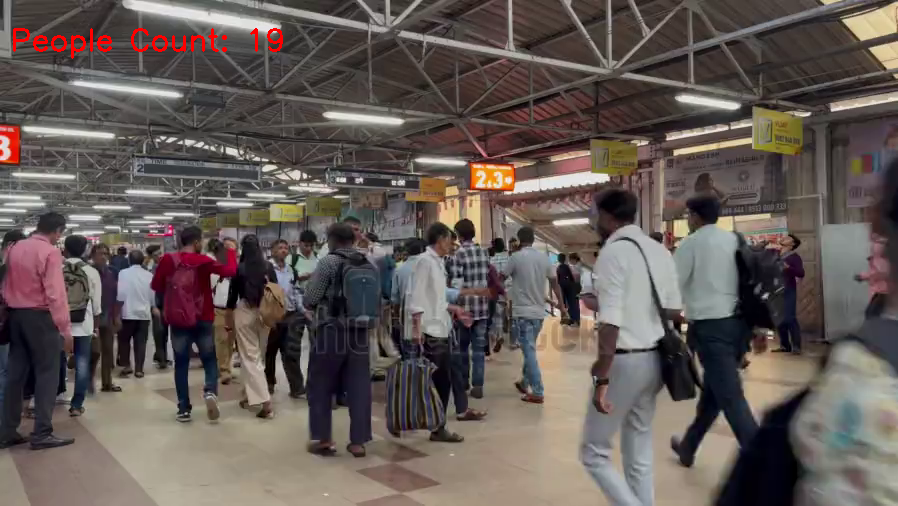

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


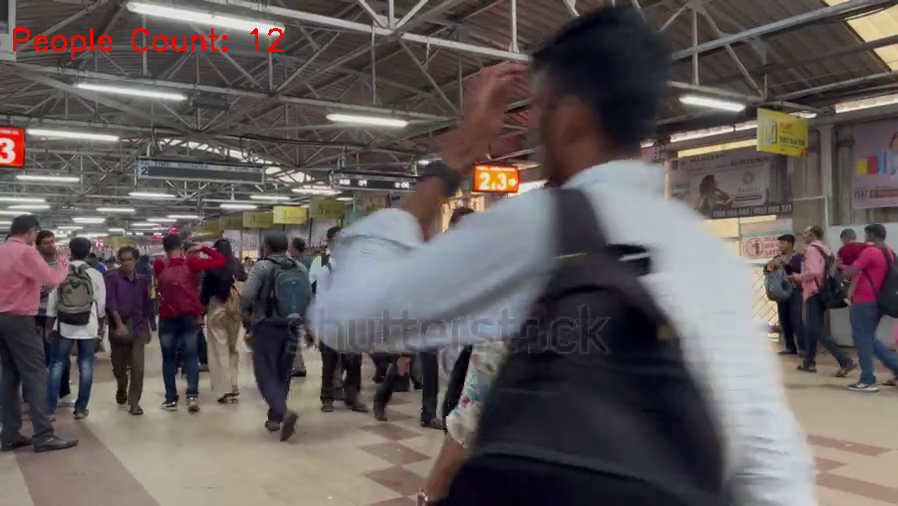

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


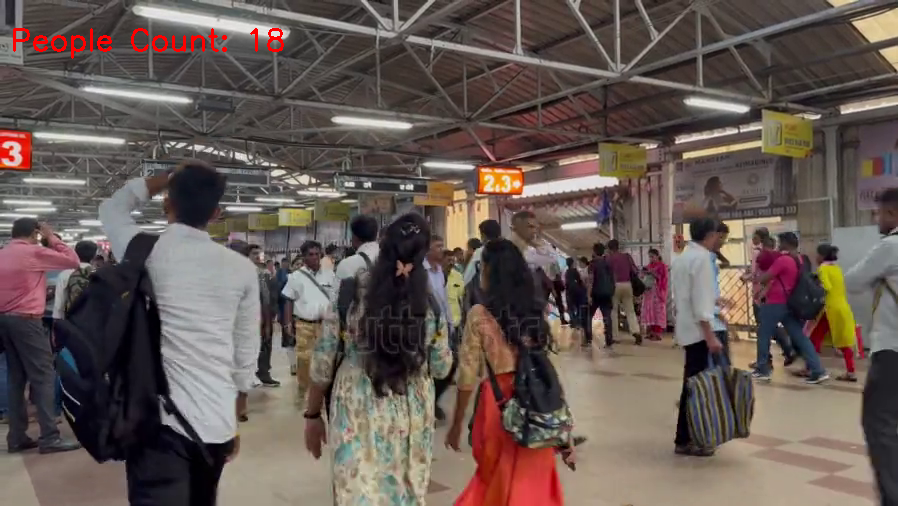

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


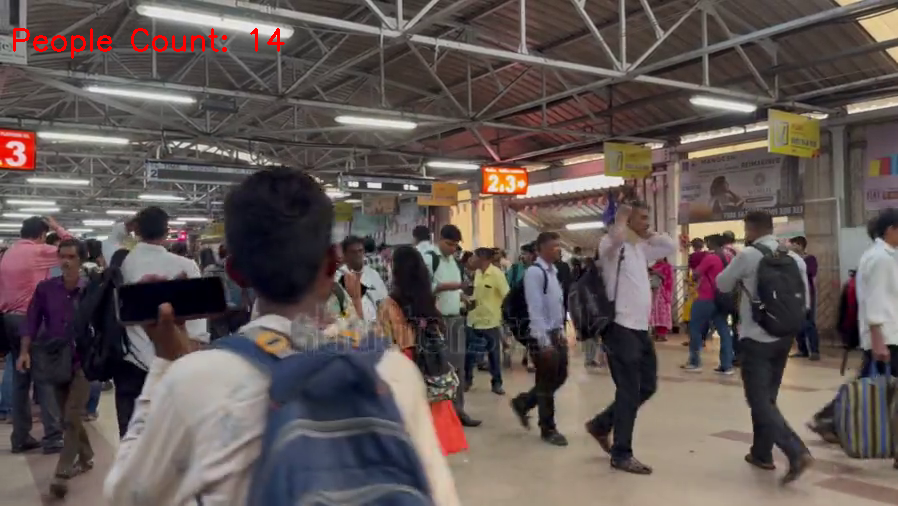

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


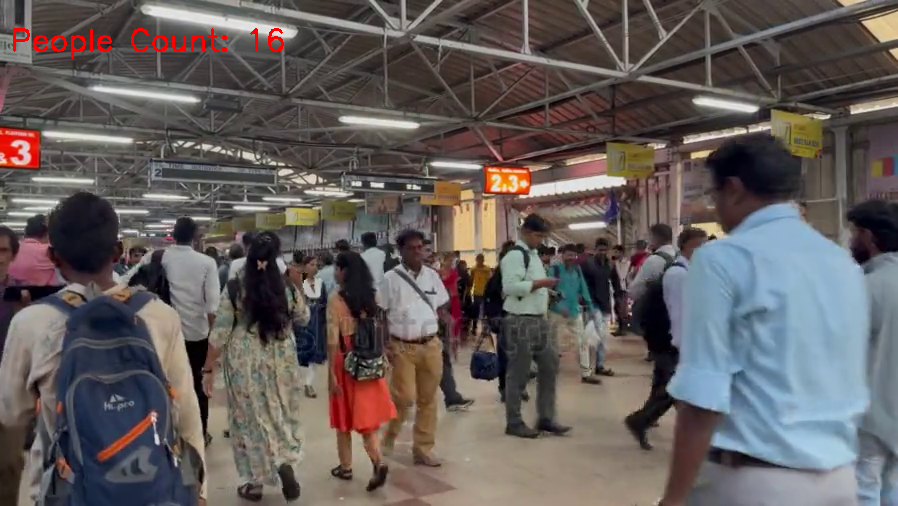

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


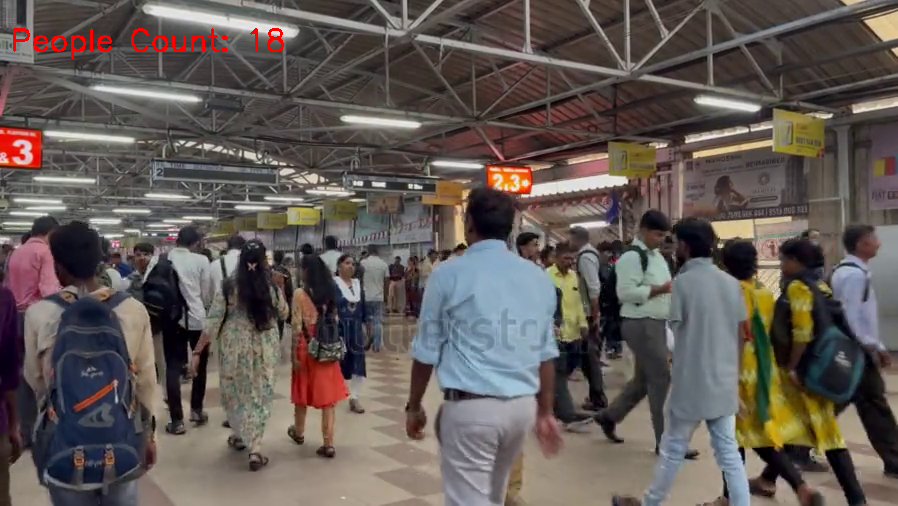

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


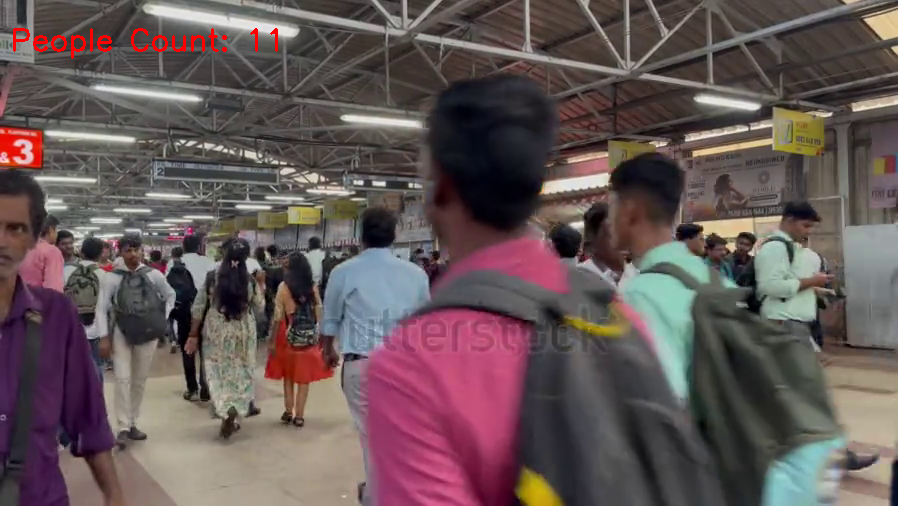

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


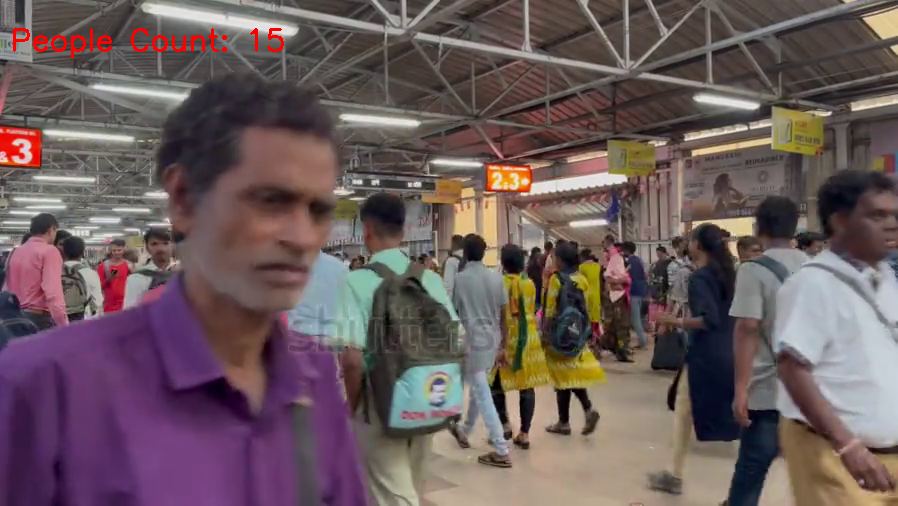

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


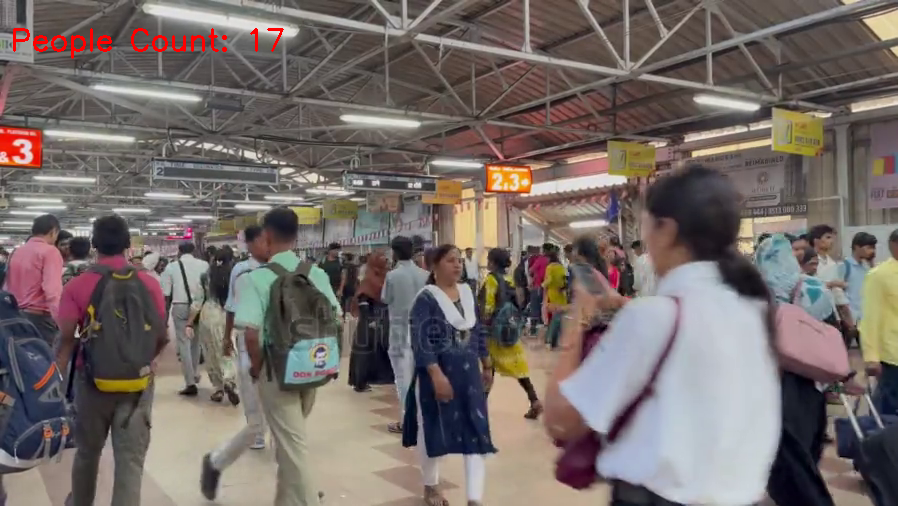

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


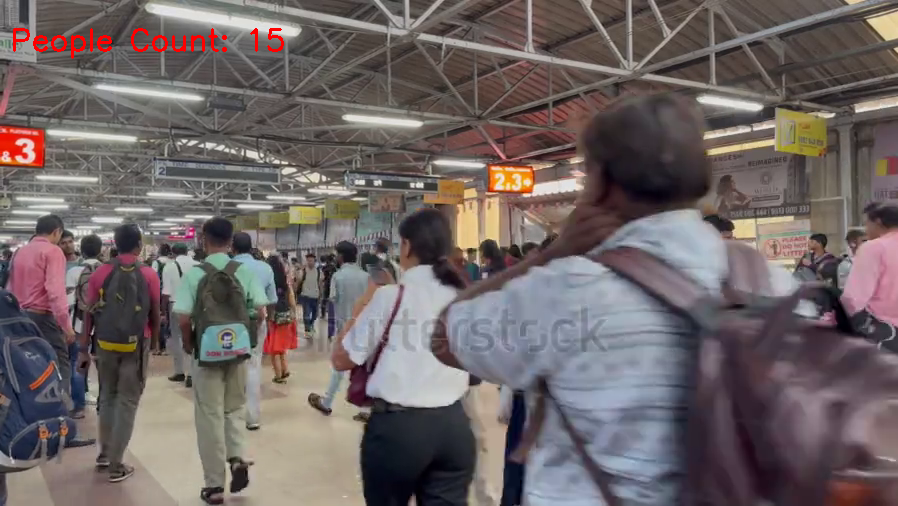

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


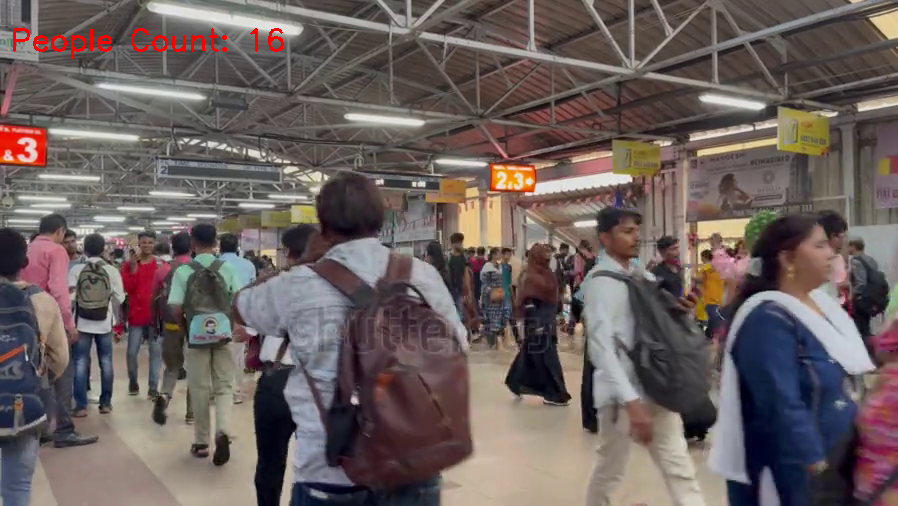

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


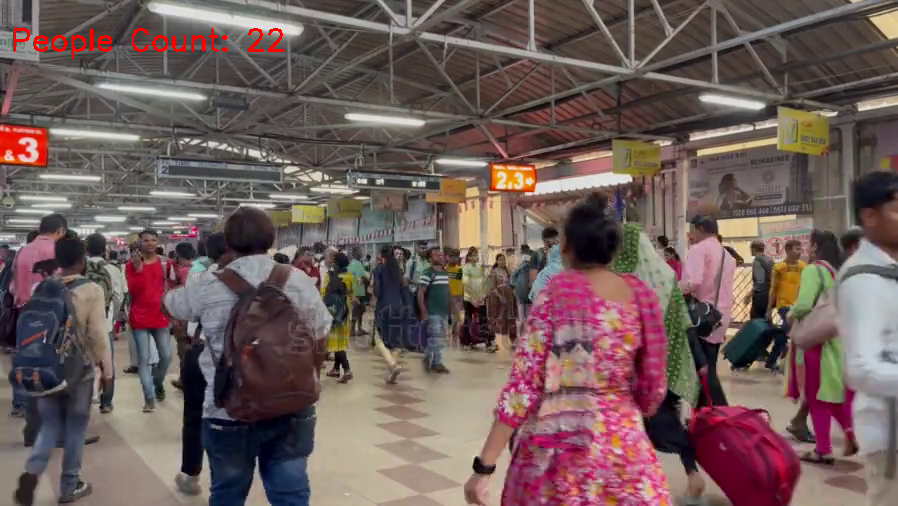

In [41]:
import torch
import cv2
from google.colab.patches import cv2_imshow # This is correctly imported

# Load the trained YOLOv5 model
model = torch.hub.load('.', 'custom', path='/content/yolov5/runs/train/exp/weights/best.pt', source='local')

# Function to run inference on a video and count people in each frame
def count_people_in_video(video_path):
    cap = cv2.VideoCapture(video_path)
    frame_count = 0
    success = True

    while success:
        success, frame = cap.read()
        if success and frame_count % 30 == 0:  # Process every 30th frame
            # Run inference
            results = model(frame)

            # Extract number of people detected
            people_count = len(results.xyxy[0])

            # Display people count on the frame
            cv2.putText(frame, f'People Count: {people_count}', (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
            cv2_imshow(frame) # Use cv2_imshow instead of cv2.imshow


            # Press 'q' to exit early
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break
        frame_count += 1

    cap.release()
    cv2.destroyAllWindows()

# Provide the path to your video
video_path = '/content/drive/My Drive/CrowdCountingData/3533352963-preview.mp4'
count_people_in_video(video_path)

For example, here we download and display a PNG image of the Colab logo: